In [ ]:
!pip install PyYAML==5.3.1

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 269 kB 5.3 MB/s 
  Created wheel for PyYAML: filename=PyYAML-5.3.1-cp37-cp37m-linux_x86_64.whl size=44636 sha256=d34409f8df2f09e0aba3cede91ec7ab23b52a037c291bd26fbcab69105985d1c
  Stored in directory: /root/.cache/pip/wheels/5e/03/1e/e1e954795d6f35dfc7b637fe2277bff021303bd9570ecea653
Successfully built PyYAML
  Attempting uninstall: PyYAML
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13


In [ ]:
#pip install albumentations

In [ ]:
iou_t = 0.5

## Импорт библиотек

In [ ]:
# based on https://www.kaggle.com/konstanter/fasterrcnn-pytorch-maskdetection

import numpy as np 
import pandas as pd 
import tensorflow as tf
import torchvision
from torchvision import transforms, datasets, models
import torch
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import albumentations as A
from albumentations.pytorch.transforms import ToTensorV2
from albumentations.augmentations.transforms import Normalize
import cv2
import os
import glob
from xml.etree import ElementTree as et
from tqdm import tqdm
import pandas as pd  
import xml.etree.ElementTree as ET
from sklearn import preprocessing
from PIL import Image as Im
from PIL import ImageDraw
from IPython.display import Image
import shutil
import random

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
# путь к файлам Kaagle
#images_dir = '../input/face-mask-detection/images/'
#annotations_dir = '../input/face-mask-detection/annotations/'

# путь к файлам Google
images_dir = '/content/gdrive/MyDrive/SF/Project_2_Face_Mask_Detection/data/images/'
annotations_dir = '/content/gdrive/MyDrive/SF/Project_2_Face_Mask_Detection/data/annotations/'

## RCNN 

## Загрузка данных в DataLoader

In [ ]:
class FaceMaskDataset(torch.utils.data.Dataset):

    def __init__(self, images_dir, annotation_dir, width, height, transforms=None):
        self.transforms = transforms
        self.images_dir = images_dir
        self.annotation_dir = annotation_dir
        self.height = height
        self.width = width
        
        # сортировка изображений
        self.imgs = [image for image in sorted(os.listdir(images_dir))]
        self.annotate = [annotate for annotate in sorted(os.listdir(annotation_dir))]
        
        # на 0й позиции находится фон
        self.classes = [_, 'without_mask','with_mask','mask_weared_incorrect']

    def __getitem__(self, idx):

        img_name = self.imgs[idx]
        image_path = os.path.join(self.images_dir, img_name)

        # изменение цвета и размера изображения    
        img = cv2.imread(image_path)
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB).astype(np.float32)
        img_res = cv2.resize(img_rgb, (self.width, self.height), cv2.INTER_AREA)
        # нормализация изображения
        img_res /= 255.0
        
        # аннотация
        annot_filename = self.annotate[idx]
        annot_file_path = os.path.join(self.annotation_dir, annot_filename)
        
        boxes = []
        labels = []
        tree = et.parse(annot_file_path)
        root = tree.getroot()
        
        # высота и ширина изображения
        wt = img.shape[1]
        ht = img.shape[0]
        
        # ограничивающие рамки
        for member in root.findall('object'):
            labels.append(self.classes.index(member.find('name').text))
            
            # bounding box
            xmin = int(member.find('bndbox').find('xmin').text)
            xmax = int(member.find('bndbox').find('xmax').text)
            
            ymin = int(member.find('bndbox').find('ymin').text)
            ymax = int(member.find('bndbox').find('ymax').text)
            

            xmin_corr = (xmin/wt)*self.width
            ymin_corr = (ymin/ht)*self.height
            if xmax >= wt:
                xmax_corr = self.width
            else:
                xmax_corr = (xmax/wt)*self.width

            if ymax >= ht:
                ymax_corr = self.height
            else:
                ymax_corr = (ymax/ht)*self.height
            
            boxes.append([xmin_corr, ymin_corr, xmax_corr, ymax_corr])
        
        # перевод boxes в формат torch.Tensor
        boxes = torch.as_tensor(boxes, dtype=torch.float32)
        
        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0])

        iscrowd = torch.zeros((boxes.shape[0],), dtype=torch.int64)
        
        labels = torch.as_tensor(labels, dtype=torch.int64)


        target = {}
        target["boxes"] = boxes
        target["labels"] = labels
        target["area"] = area
        target["iscrowd"] = iscrowd

        image_id = torch.tensor([idx])
        target["image_id"] = image_id


        if self.transforms:
            
            sample = self.transforms(image = img_res,
                                     bboxes = target['boxes'],
                                     labels = labels)
            img_res = sample['image']
            target['boxes'] = torch.Tensor(sample['bboxes'])  

        return img_res, target

    def __len__(self):
        return len(self.imgs)

In [ ]:
# проверка датасета
dataset = FaceMaskDataset(images_dir, annotations_dir, 224, 224)
print('length of dataset = ', len(dataset), '\n')

img, target = dataset[78]
print('Image shape = ', img.shape, '\n','Target - ', target)

length of dataset =  853 

Image shape =  (224, 224, 3) 
 Target -  {'boxes': tensor([[113.1163, 146.7200, 163.7209, 205.5200]]), 'labels': tensor([2]), 'area': tensor([2975.5537]), 'iscrowd': tensor([0]), 'image_id': tensor([78])}


In [ ]:
# Вспомогательная функция для визуализации bbox

def plot_img_bbox(img, target, device = 'cpu'):
    fig, a = plt.subplots(1,1)
    fig.set_size_inches(5,5)
    a.imshow(img)
    for box in (target['boxes'].to(device)):
      x, y, width, height  = box[0], box[1], box[2]-box[0], box[3]-box[1]
      rect = patches.Rectangle((x, y),
                               width, height,
                               linewidth = 2,
                               edgecolor = 'r',
                               facecolor = 'none')

      # Визуализация bbox поверх картинки
      a.add_patch(rect)
    plt.show()

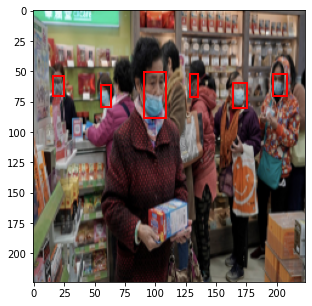

In [ ]:
img, target = dataset[35]
plot_img_bbox(img, target)

In [ ]:
def get_transform(train):
    
    if train:
        return A.Compose([
            ToTensorV2()
            ], bbox_params={'format': 'pascal_voc', 'label_fields': ['labels']})
    else:
        return A.Compose([
            ToTensorV2()
            ], bbox_params={'format': 'pascal_voc', 'label_fields': ['labels']})

In [ ]:
def collate_fn(batch):
    return tuple(zip(*batch))

In [ ]:
dataset = FaceMaskDataset(images_dir, annotations_dir, 480, 480,
                          transforms= get_transform(train=True))
dataset_test = FaceMaskDataset(images_dir, annotations_dir, 480, 480,
                               transforms= get_transform(train=False))

# деление данных на train и test
torch.manual_seed(1)
indices = torch.randperm(len(dataset)).tolist()

test_split = 0.2
tsize = int(len(dataset)*test_split)
dataset = torch.utils.data.Subset(dataset, indices[:-tsize])
dataset_test = torch.utils.data.Subset(dataset_test, indices[-tsize:])

num_workers = 2
batch_size = 10

data_loader = torch.utils.data.DataLoader(
    dataset, batch_size=batch_size, shuffle=True, num_workers=num_workers,
    collate_fn=collate_fn)

data_loader_test = torch.utils.data.DataLoader(
    dataset_test, batch_size=batch_size, shuffle=False, num_workers=num_workers,
    collate_fn=collate_fn)

## Визуализация одного батча

In [ ]:
img_train = next(iter(data_loader))

In [ ]:
def image_convert(image):
    image = image.clone().cpu().numpy()
    image = image.transpose((1,2,0))
    image = (image * 255).astype(np.uint8)
    return image

In [ ]:
def plot_batch(data, batch_size = batch_size):
    pic_box = plt.figure(figsize=(16,32))
    
    for img in range(batch_size):
        image = data[0][img]
        image = image_convert(image)
        image = np.ascontiguousarray(image)
        bbox = data[1][img]['boxes'].numpy()
        for i in bbox:
            cv2.rectangle(image, (int(i[0]),int(i[1])),
                          (int(i[2]),int(i[3])), (0,255,0), thickness=2)
        pic_box.add_subplot(5,2,img+1)
        plt.imshow(image)
        plt.axis('off')
    plt.show()  

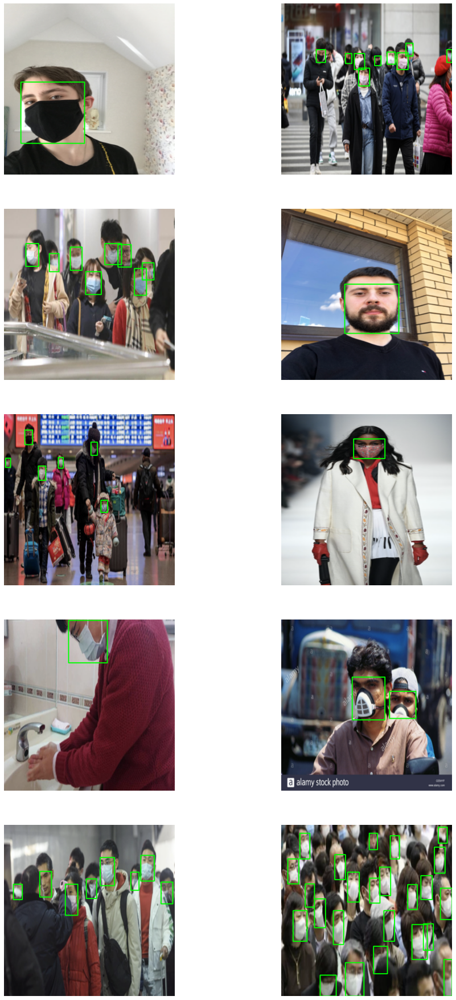

In [ ]:
plot_batch(img_train)

## Обучение модели

In [ ]:
def get_model_instance_segmentation(num_classes):
    model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
   
    in_features = model.roi_heads.box_predictor.cls_score.in_features

    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

    return model

Обучение модели на 100 эпохах

In [ ]:
%time
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

num_classes = 4

model = get_model_instance_segmentation(num_classes)

num_epochs = 10

model.to(device)


params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr=0.005,
                            momentum=0.9, weight_decay=0.0005)

lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer,
                                               step_size=3,
                                               gamma=0.1)
len_dataloader = len(data_loader)

for epoch in tqdm(range(num_epochs)):
    model.train()
    i = 0    
    epoch_loss = 0
    for imgs, annotations in data_loader:
        i += 1
        imgs = list(img.to(device) for img in imgs)
        annotations = [{k: v.to(device) for k, v in t.items()} for t in annotations]
        loss_dict = model(imgs, annotations)
        losses = sum(loss for loss in loss_dict.values())        

        optimizer.zero_grad()
        losses.backward()
        optimizer.step()         
        epoch_loss += losses.item()
    print('Epoch_loss = ',epoch_loss)


CPU times: user 2 µs, sys: 0 ns, total: 2 µs
Wall time: 5.25 µs


/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth


  0%|          | 0.00/160M [00:00<?, ?B/s]

 10%|█         | 1/10 [02:04<18:38, 124.23s/it]

Epoch_loss =  34.482385620474815


 20%|██        | 2/10 [04:16<17:10, 128.77s/it]

Epoch_loss =  21.973151832818985


 30%|███       | 3/10 [06:29<15:16, 130.98s/it]

Epoch_loss =  18.499172657728195


 40%|████      | 4/10 [08:43<13:12, 132.11s/it]

Epoch_loss =  16.046409346163273


 50%|█████     | 5/10 [10:57<11:03, 132.65s/it]

Epoch_loss =  14.828727379441261


 60%|██████    | 6/10 [13:10<08:52, 133.01s/it]

Epoch_loss =  12.989173725247383


 70%|███████   | 7/10 [15:25<06:40, 133.41s/it]

Epoch_loss =  11.850512102246284


 80%|████████  | 8/10 [17:39<04:27, 133.63s/it]

Epoch_loss =  11.127919025719166


 90%|█████████ | 9/10 [19:52<02:13, 133.59s/it]

Epoch_loss =  10.145069248974323


100%|██████████| 10/10 [22:06<00:00, 132.63s/it]

Epoch_loss =  9.62980006635189


Демонстрация качества модели на train-данных

In [ ]:
# вспомогательная функция принимает исходный прогноз и порог iou

def apply_nms(orig_prediction, iou_thresh=0.3):
    
    keep = torchvision.ops.nms(orig_prediction['boxes'],
                               orig_prediction['scores'], iou_thresh)
    
    final_prediction = orig_prediction
    final_prediction['boxes'] = final_prediction['boxes'][keep]
    final_prediction['scores'] = final_prediction['scores'][keep]
    final_prediction['labels'] = final_prediction['labels'][keep]
    
    return final_prediction

def torch_to_pil(img):
    return transforms.ToPILImage()(img).convert('RGB')

In [ ]:
img, target = dataset_test[random.randint(0, len(dataset_test))]

model.eval()
with torch.no_grad():
    prediction = model([img.to(device)])[0]
print('predicted #boxes: ', len(model([img.to(device)])[0]['labels']))
print('real #boxes: ', len(target['labels']))

predicted #boxes:  16
real #boxes:  10


In [ ]:
# определение порога на качество предсказания
nms_prediction = apply_nms(prediction, iou_thresh=0.2)

EXPECTED OUTPUT


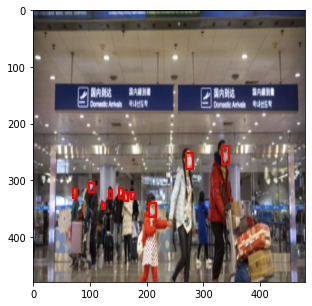

MODEL OUTPUT


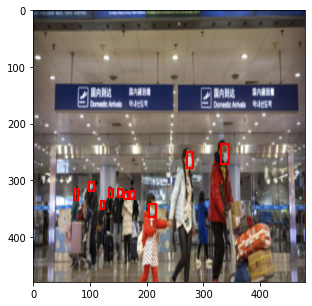

NMS APPLIED MODEL OUTPUT


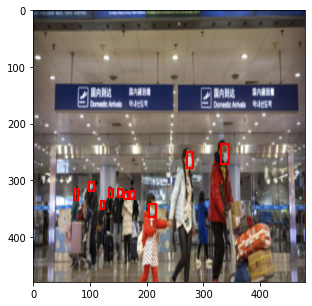

In [ ]:
#pic_box = plt.figure(figsize=(8,24))
kind_img = {0:['EXPECTED OUTPUT', target], 1: ['MODEL OUTPUT', prediction],
            2: ['NMS APPLIED MODEL OUTPUT',nms_prediction]}

for kind in range(3):
  print(kind_img.get(kind)[0])
  plot_img_bbox(torch_to_pil(img), kind_img.get(kind)[1])

## Визуализация моделирования

In [ ]:
def plot_image(img_tensor, annotation, predict=True, device='cpu'):
    
    fig,ax = plt.subplots(figsize=(7,7))
    img = img_tensor.cpu().data
    mask_dic = {1:'without_mask', 2:'with_mask', 3:'mask_weared_incorrect'}

    ax.imshow(img.permute(1, 2, 0))
    for i,box in enumerate(annotation["boxes"].to(device)):
        xmin, ymin, xmax, ymax = box
        
        rect = patches.Rectangle((xmin,ymin),(xmax-xmin),
                                 (ymax-ymin),linewidth=1,
                                 edgecolor='r',facecolor='none')
      

        ax.add_patch(rect)
        label = mask_dic[int(annotation['labels'][i].data)]
        props_with = dict(facecolor='green', alpha=0.3)
        props_without = dict(facecolor='red', alpha=0.3)
        props_incorr = dict(facecolor='wellow', alpha=0.3)
        if predict:
            score = int((annotation['scores'][i].data) * 100)
            if label == 'without_mask':
              ax.text(xmin, ymin, f"{label} : {score}%",
                      horizontalalignment='center', verticalalignment='center',
                      fontsize=20,color='w', bbox=props_without)
            elif label == 'with_mask':
              ax.text(xmin, ymin, f"{label} : {score}%",
                      horizontalalignment='center', verticalalignment='center',
                      fontsize=20,color='w', bbox=props_with)
            elif label == 'mask_weared_incorrect':
              ax.text(xmin, ymin, f"{label} : {score}%",
                      horizontalalignment='center', verticalalignment='center',
                      fontsize=20,color='w', bbox=props_incorr)              
        else:
            score=''
            ax.text(xmin, ymin, f"{label}", horizontalalignment='center',
                    verticalalignment='center',fontsize=20,color='w',
                    bbox=props_with)
    
    plt.show()

In [ ]:
for imgs, annotations in data_loader:
        imgs = list(img.to(device) for img in imgs)
        annotations = [{k: v.to(device) for k, v in t.items()} for t in annotations]
        break

In [ ]:
model.eval()
preds = model(imgs)
print (len(imgs))

10


Prediction 1


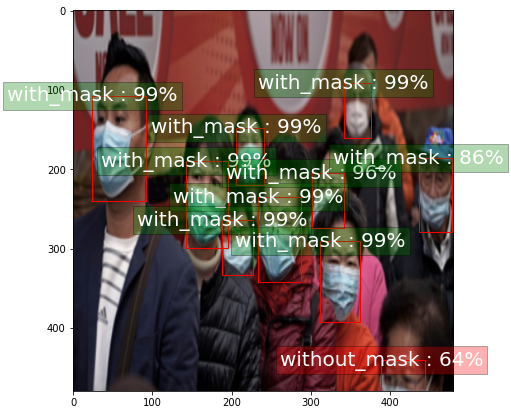

Target 1


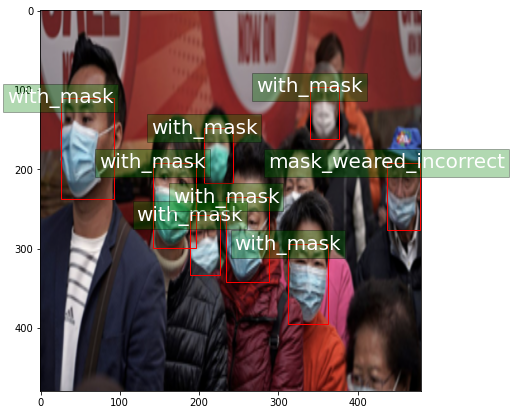

Prediction 2


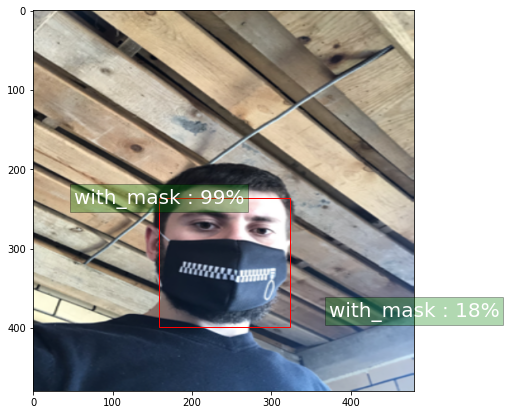

Target 2


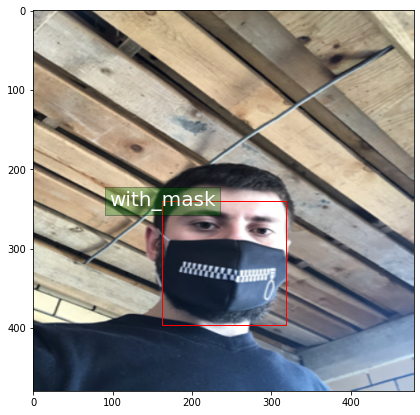

Prediction 3


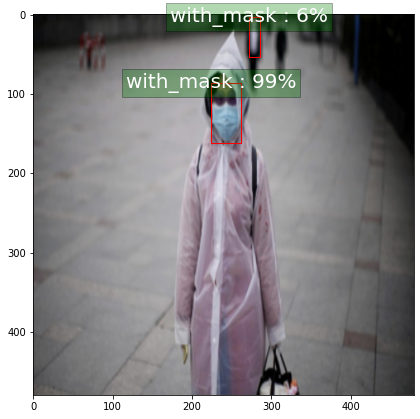

Target 3


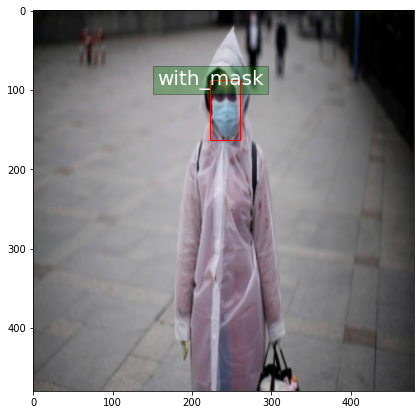

Prediction 4


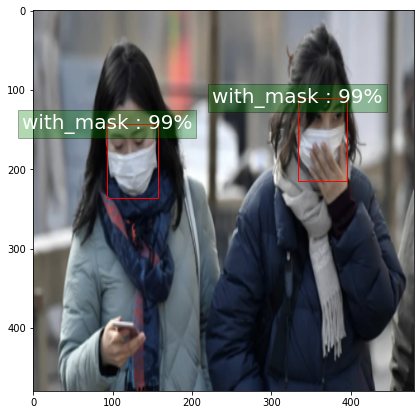

Target 4


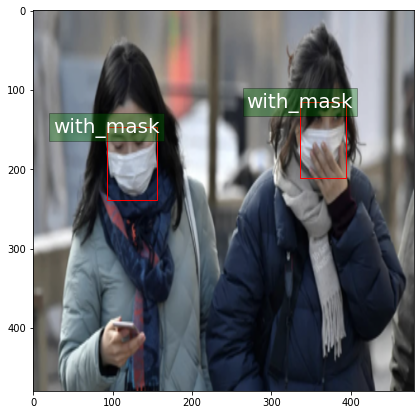

Prediction 5


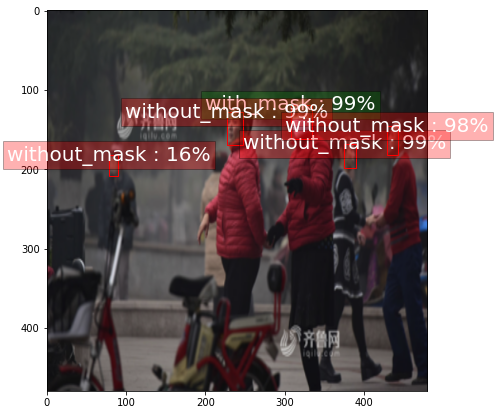

Target 5


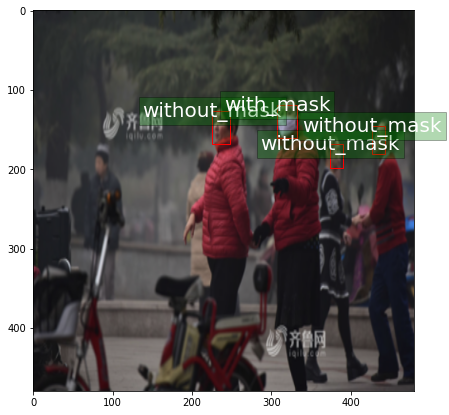

Prediction 6


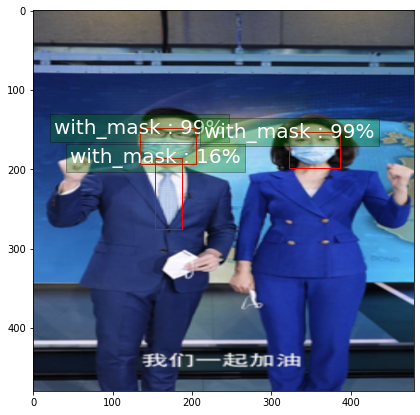

Target 6


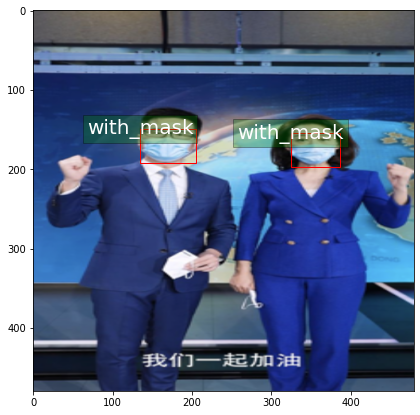

Prediction 7


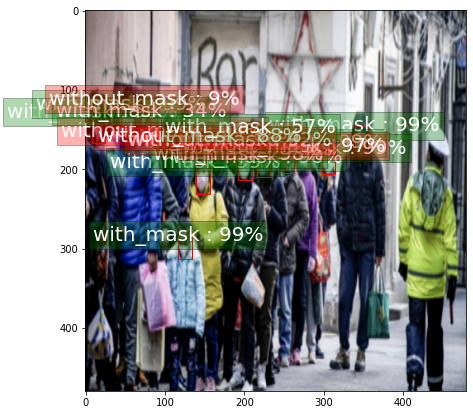

Target 7


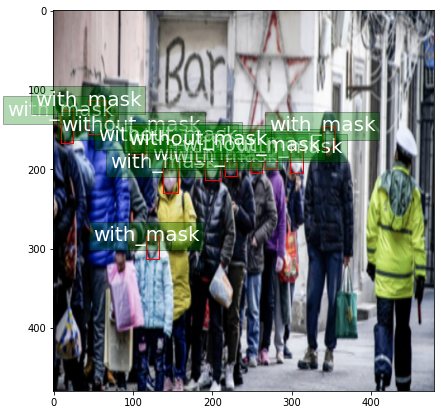

Prediction 8


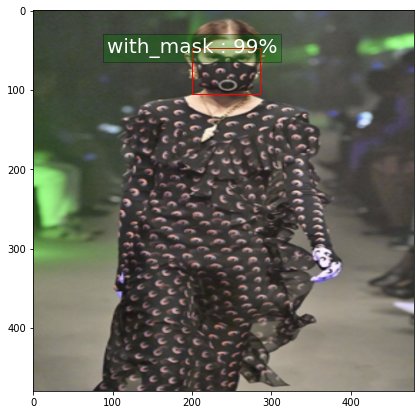

Target 8


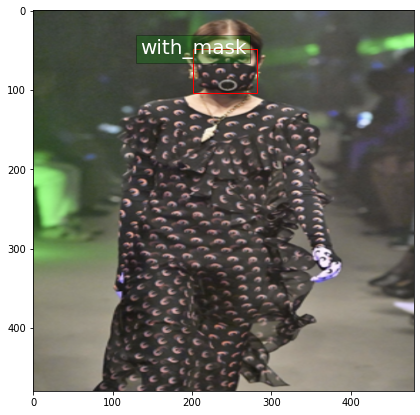

Prediction 9


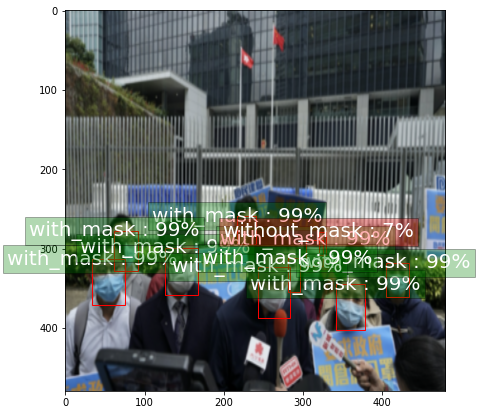

Target 9


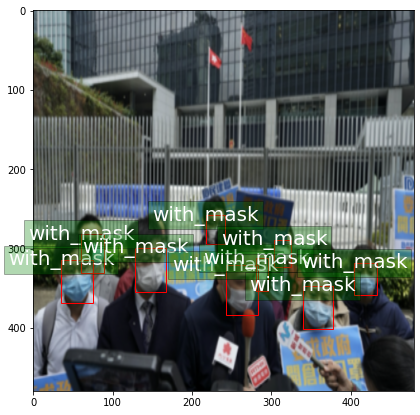

Prediction 10


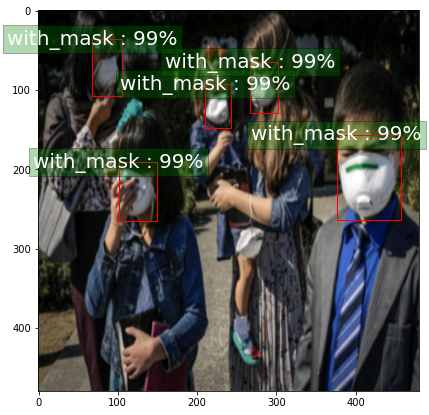

Target 10


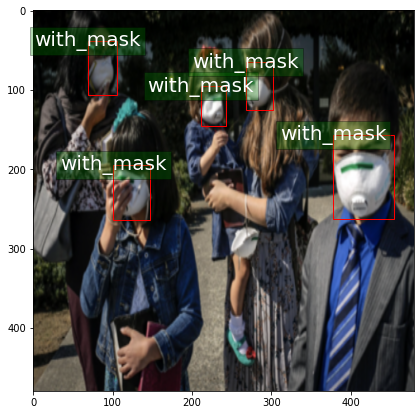

In [ ]:
with torch.no_grad():
    for idx in range (len(imgs)):
        nms_prediction = apply_nms(preds[idx], iou_thresh=0.2)
        print(f'Prediction {idx+1}')
        plot_image(imgs[idx], nms_prediction)
        print(f'Target {idx+1}')
        plot_image(imgs[idx].to('cpu'), annotations[idx],False)

## Предсказания

In [ ]:
def make_prediction(model, img, threshold):
    model.eval()
    preds = model(img)
    for id in range(len(preds)) :
        idx_list = []

        for idx, score in enumerate(preds[id]['scores']) :
            if score > threshold : 
                idx_list.append(idx)

        preds[id]['boxes'] = preds[id]['boxes'][idx_list]
        preds[id]['labels'] = preds[id]['labels'][idx_list]
        preds[id]['scores'] = preds[id]['scores'][idx_list]

    return preds

In [ ]:
# предсказание в неграфическом варианте
with torch.no_grad(): 
    # batch size of the test set = 2
    for imgs, annotations in data_loader_test:
        imgs = list(img.to(device) for img in imgs)

        pred = make_prediction(model, imgs, iou_t)
        print(pred)
        break

[{'boxes': tensor([[209.5942, 101.4601, 254.0737, 166.2267],
        [394.1532, 256.2497, 411.4643, 280.3535],
        [160.0937, 328.3282, 212.9790, 424.8001],
        [321.6479, 344.2100, 346.6790, 404.2479],
        [383.1453, 354.7384, 440.9824, 468.6075],
        [317.0274, 291.5579, 332.1830, 319.7787],
        [379.8053, 263.3203, 391.6372, 286.3339],
        [  7.3287, 300.4408,  87.8067, 451.9164],
        [376.2035, 324.7027, 386.0954, 351.4940]], device='cuda:0'), 'labels': tensor([2, 2, 2, 2, 2, 2, 2, 2, 2], device='cuda:0'), 'scores': tensor([0.9993, 0.9981, 0.9976, 0.9966, 0.9959, 0.9857, 0.9817, 0.8295, 0.6364],
       device='cuda:0')}, {'boxes': tensor([[167.4662, 113.5706, 198.6562, 167.4145],
        [220.9898, 123.8197, 246.0604, 159.5507],
        [274.1154, 117.8990, 296.8390, 156.3395],
        [315.2343, 120.1674, 327.8180, 144.3924],
        [ 97.5728,  80.7664, 129.1978, 135.6597],
        [298.8562, 134.6877, 313.4985, 160.4416],
        [347.9778, 132.1012, 

In [ ]:
labels = []
preds_adj_all = []
annot_all = []

for im, annot in tqdm(data_loader_test, position = 0, leave = True):
    im = list(img.to(device) for img in im)

    for t in annot:
        labels += t['labels']

    with torch.no_grad():
        preds_adj = make_prediction(model, im, iou_t)
        preds_adj = [{k: v.to(torch.device('cpu')) for k, v in t.items()} for t in preds_adj]
        preds_adj_all.append(preds_adj)
        annot_all.append(annot)

100%|██████████| 17/17 [00:16<00:00,  1.06it/s]


In [ ]:
def bbox_iou(box1, box2, x1y1x2y2=True):
    """
    Returns the IoU of two bounding boxes
    """
    if not x1y1x2y2:
        # Данные для расчета, если координаты в формате:
        # центр по оси х, центр по оси у, ширины, высота
        b1_x1, b1_x2 = box1[:, 0] - box1[:, 2] / 2, box1[:, 0] + box1[:, 2] / 2
        b1_y1, b1_y2 = box1[:, 1] - box1[:, 3] / 2, box1[:, 1] + box1[:, 3] / 2
        b2_x1, b2_x2 = box2[:, 0] - box2[:, 2] / 2, box2[:, 0] + box2[:, 2] / 2
        b2_y1, b2_y2 = box2[:, 1] - box2[:, 3] / 2, box2[:, 1] + box2[:, 3] / 2
    else:
        # Данные для расчета, если координаты в формате:
        # x(min), y(min), x(max), y(max)
        b1_x1, b1_y1, b1_x2, b1_y2 = box1[:, 0], box1[:, 1], box1[:, 2], box1[:, 3]
        b2_x1, b2_y1, b2_x2, b2_y2 = box2[:, 0], box2[:, 1], box2[:, 2], box2[:, 3]

    # Координаты прямоугольника пересечения боксов
    inter_rect_x1 = torch.max(b1_x1, b2_x1)
    inter_rect_y1 = torch.max(b1_y1, b2_y1)
    inter_rect_x2 = torch.min(b1_x2, b2_x2)
    inter_rect_y2 = torch.min(b1_y2, b2_y2)
    
    # Площадь пересечения
    inter_area = torch.clamp(inter_rect_x2 - inter_rect_x1 + 1, min=0) * torch.clamp(inter_rect_y2 - inter_rect_y1 + 1, min=0)
    # Общая площадь
    b1_area = (b1_x2 - b1_x1 + 1) * (b1_y2 - b1_y1 + 1)
    b2_area = (b2_x2 - b2_x1 + 1) * (b2_y2 - b2_y1 + 1)

    iou = inter_area / (b1_area + b2_area - inter_area + 1e-16)

    return iou

In [ ]:
# Функция метрик для каждого изображения
def get_img_statistics(steps, prediction, target_labels,target_boxes,iou_threshold):
    iou = np.zeros([0])
    tp = np.zeros([0])
    fp = np.zeros([0])
    fn = np.zeros([0])
            
    for pred_i in range(steps): # проход по боксам
        pred_box = prediction['boxes'][pred_i]
        pred_label = prediction['labels'][pred_i]
        tar_label = target_labels[pred_i]
        
        # наилучший показатель iou для бокса
        iou_estim, box_index = bbox_iou(pred_box.unsqueeze(0), target_boxes).max(0)  
        iou = np.append(iou, iou_estim.numpy())
        
        # если метки совпадают
        if pred_label == tar_label:
            if iou_estim >= iou_threshold:
                tp = np.append(tp, 1)
                fp = np.append(fp, 0)
            else:
                tp = np.append(tp, 0)
                fp = np.append(fp, 1)
            fn = np.append(fn, 0)    
        # если метки не совпадают
        else:
            tp = np.append(tp, 0)
            fp = np.append(fp, 0)
            fn = np.append(fn, 1)
    return iou, tp, fp, fn

In [ ]:
# метрика для изображений батча
def get_batch_statistics(outputs, targets, iou_threshold):
    
    iou_batch = np.zeros([0]) 
    tp_batch = np.zeros([0])
    fp_batch = np.zeros([0])
    fn_batch = np.zeros([0])
    
    for sample_i in range(len(outputs)): # проход по изображениям батча
        if outputs[sample_i] is None:
            continue

        output = outputs[sample_i] # predict
        # pred_boxes = output['boxes']
        # pred_scores = output['scores']
        # pred_labels = output['labels']

        annotations = targets[sample_i]
        target_labels = annotations['labels'] if len(annotations) else []
        if len(annotations):    # для непустых предсказания
            detected_boxes = []
            target_boxes = annotations['boxes']
            
            num_targets = len(target_labels)
            num_pred = len(output['labels'])
            cycle = min(num_targets, num_pred)

            # подсчет метрик, где количество предсказанных боксов
            # совпадает с количеством таргетов
            if num_pred == num_targets:
                iou_box, tp_box, fp_box, fn_box = get_img_statistics(cycle, output,
                                                                     target_labels,
                                                                     target_boxes,
                                                                     iou_threshold)
                
            # подсчет метрик, где количество предсказанных боксов
            # больше количества таргетов
            elif num_pred > num_targets:
                excsess_zero = np.zeros([num_pred - num_targets])
                excsess_one = np.ones([num_pred - num_targets])
                    
                iou_box, tp_box, fp_box, fn_box = get_img_statistics(cycle, output,
                                                                     target_labels,
                                                                     target_boxes,
                                                                     iou_threshold)
                
                tp_box = np.append(tp_box, excsess_zero)
                fp_box = np.append(fp_box, excsess_one)
                fn_box = np.append(fn_box, excsess_zero)
                iou_box = np.append(iou_box, excsess_zero)
                                    
            # подсчет метрик, где количество предсказанных боксов\
            # меньше количества таргетов
            elif num_pred < num_targets:
                deficiency_zero = np.zeros([num_targets - num_pred])
                deficiency_one = np.ones([num_targets - num_pred])

                iou_box, tp_box, fp_box, fn_box = get_img_statistics(cycle, output,
                                                                     target_labels,
                                                                     target_boxes,
                                                                     iou_threshold)
                tp_box = np.append(tp_box, deficiency_zero)
                fp_box = np.append(fp_box, deficiency_zero)
                fn_box = np.append(fn_box, deficiency_one)

            # статистика по изображению        
            iou_img = np.mean(iou_box)        
            tp_img = np.sum(tp_box)
            fp_img = np.sum(fp_box)
            fn_img = np.sum(fn_box)
            
       
        # статистика по батчу в формате списка
        iou_batch = np.append(iou_batch, iou_img)
        iou_batch = np.nan_to_num(iou_batch, nan=0)

        tp_batch = np.append(tp_batch, tp_img)
        fp_batch = np.append(fp_batch, fp_img)
        fn_batch = np.append(fn_batch, fn_img)

    
    return iou_batch, tp_batch, fp_batch, fn_batch

In [ ]:
for batch_i in range(len(preds_adj_all)):
    metrics_for_stack = get_batch_statistics(preds_adj_all[batch_i], annot_all[batch_i], iou_threshold=iou_t)
    if batch_i==0:
        sample_metrics = metrics_for_stack
    else:
        sample_metrics = np.hstack((sample_metrics,metrics_for_stack))

In [ ]:
metrics_df = pd.DataFrame(data = sample_metrics.T, columns =["iou", "tp", "fp", "fn"])

In [ ]:
metrics_df

,iou,tp,fp,fn
0,0.697822,7.0,1.0,1.0
1,0.782731,5.0,0.0,4.0
2,0.443513,1.0,1.0,0.0
3,0.660669,4.0,1.0,0.0
4,0.720919,1.0,0.0,0.0
...,...,...,...,...
165,0.300017,0.0,2.0,1.0
166,0.701368,2.0,0.0,0.0
167,0.749069,1.0,0.0,0.0
168,0.554799,6.0,3.0,5.0


In [ ]:
metrics_df['recall'] = metrics_df['tp']/(metrics_df['tp']+metrics_df['fn'])
metrics_df['precision'] = metrics_df['tp']/(metrics_df['tp']+metrics_df['fp'])

In [ ]:
metrics_df = metrics_df.fillna(0)

In [ ]:
tp = metrics_df['tp'].sum()
fn = metrics_df['fn'].sum()
fp = metrics_df['fp'].sum()

recall = tp/(tp+fn)
precision = tp/(tp+fp)

ap = metrics_df['precision'].mean()
iou = metrics_df['iou'].mean()

print('recall = ', recall)
print('precision = ', precision)
print('iou = ', iou)
print('ap = ', ap)

recall =  0.728515625
precision =  0.8325892857142857
iou =  0.7575601227649554
ap =  0.853795841735623


# YOLO

In [ ]:
def xml_to_csv(path = annotations_dir):
    xml_list = []
    for xml_file in tqdm(glob.glob(path+ '*.xml')):
        tree = ET.parse(xml_file)
        root = tree.getroot()
        for obj in root.findall('object'):
            bbx = obj.find('bndbox')
            xmin = int(bbx.find('xmin').text)
            ymin = int(bbx.find('ymin').text)
            xmax = int(bbx.find('xmax').text)
            ymax = int(bbx.find('ymax').text)
            label = obj.find('name').text

            value = (root.find('filename').text.replace('png', 'jpg'),
                     int(root.find('size')[2].text),
                     int(root.find('size')[0].text),
                     int(root.find('size')[1].text),
                     label,
                     xmin,
                     ymin,
                     xmax,
                     ymax
                     )
            xml_list.append(value)
    column_name = ['filename', 'channels', 'width', 'height',
                   'class', 'xmin', 'ymin', 'xmax', 'ymax']
    xml_df = pd.DataFrame(xml_list, columns=column_name)
    return xml_df

In [ ]:
xml_df = xml_to_csv()
xml_df.to_csv('masks.csv', index=None)
print('Конвертация прошла успешно.')

100%|██████████| 853/853 [00:06<00:00, 132.11it/s]

Конвертация прошла успешно.


In [ ]:
xml_df.shape[0]

4072

In [ ]:
xml_df.head()

,filename,channels,width,height,class,xmin,ymin,xmax,ymax
0,maksssksksss109.jpg,3,400,400,with_mask,216,92,372,251
1,maksssksksss101.jpg,3,301,400,with_mask,48,294,164,400
2,maksssksksss100.jpg,3,400,226,with_mask,189,30,245,88
3,maksssksksss100.jpg,3,400,226,with_mask,387,54,400,75
4,maksssksksss100.jpg,3,400,226,with_mask,118,87,163,126


In [ ]:
print(f'Общее количество объектов {xml_df.shape[0]}')
print(f'Количество изображений в датафрэйме {len(np.unique(xml_df["filename"]))}')

Общее количество объектов 4072
Количество изображений в датафрэйме 853


## Обработка данных 

Кодирование классов обьектов.

In [ ]:
le = preprocessing.LabelEncoder()
xml_df['class'] = le.fit_transform(xml_df['class'])

In [ ]:
xml_df.head()

,filename,channels,width,height,class,xmin,ymin,xmax,ymax
0,maksssksksss109.jpg,3,400,400,1,216,92,372,251
1,maksssksksss101.jpg,3,301,400,1,48,294,164,400
2,maksssksksss100.jpg,3,400,226,1,189,30,245,88
3,maksssksksss100.jpg,3,400,226,1,387,54,400,75
4,maksssksksss100.jpg,3,400,226,1,118,87,163,126


Сохранение кодировки классов в переменной mapping.

In [ ]:
mapping = dict(zip(le.classes_, range(len(le.classes_))))

In [ ]:
mapping

{'mask_weared_incorrect': 0, 'with_mask': 1, 'without_mask': 2}

Приведение данных к формату YOLOv5.

In [ ]:
def convert_to_yolov5(df, unique_img_names):

    df_array = np.array(df)

    # Для каждого объкта
    for i in range(len(df)):
        print_buffer = []

        point =  df_array[i]
        img_name = point[0]

        # Для каждого уникального изображения
        for unique_img_name in unique_img_names:
          if img_name == unique_img_name:
            class_id = point[4]

            # Преобразование координат bbox 
            X = (point[5] + point[7]) / 2 
            Y = (point[6] + point[8]) / 2 
            Width = (point[7] - point[5])
            Height = (point[8] - point[6])
             
            # Нормализация координат
            image_c, image_w, image_h = point[1], point[2], point[3] 
            X /= image_w 
            Y /= image_h 
            Width /= image_w 
            Height /= image_h
                          
            # Запись информации о bbox в файл
            print_buffer.append("{} {:.3f} {:.3f} {:.3f} {:.3f}".format(class_id, X, Y, Width, Height))

        # Сохранения файла с информацией
        if not os.path.isdir("masks/coordinate/"):
          os.makedirs("masks/coordinate/")
          save_file_name = os.path.join("masks/coordinate/", img_name.replace("jpg", "txt"))
        else:
          save_file_name = os.path.join("masks/coordinate/", img_name.replace("jpg", "txt"))

        # Сохраним аннотации на диск
        print("\n".join(print_buffer), file= open(save_file_name, "a"))

In [ ]:
# Список уникальных имен изображений
unique_img_names = xml_df['filename'].unique()
print(len(unique_img_names))

853


In [ ]:
# Аннотации в новом формате
convert_to_yolov5(xml_df, unique_img_names)

Копирование изображений с диска

In [ ]:
out_dir = os.path.join(images_dir)
in_dir = os.path.join('masks/images')
if os.path.exists(in_dir):
  shutil.rmtree(in_dir)
shutil.copytree(out_dir, in_dir)

'masks/images'

Изменение формата изображения на jpg для yolo

In [ ]:
dir = '/content/masks/images'
files = os.listdir('/content/masks/images')
for img in files:
  image = Im.open(os.path.join(dir, img))
  rgb_image = image.convert('RGB')
  rgb_image.save(os.path.join(dir, img.replace("png", "jpg")))

Тестирование трансформированных аннотиции с помощью визуализации.

In [ ]:
class_id_to_name_mapping = dict(zip(mapping.values(), mapping.keys()))

In [ ]:
def plot_bounding_box(image, annotation_list):
    annotations = np.array(annotation_list)
    w, h = image.size

    plotted_image = ImageDraw.Draw(image)

    transformed_annotations = np.copy(annotations)
    print(transformed_annotations)
    transformed_annotations[:,[1,3]] = annotations[:,[1,3]] * w
    transformed_annotations[:,[2,4]] = annotations[:,[2,4]] * h 
    
    transformed_annotations[:,1] = transformed_annotations[:,1] - (transformed_annotations[:,3] / 2)
    transformed_annotations[:,2] = transformed_annotations[:,2] - (transformed_annotations[:,4] / 2)
    transformed_annotations[:,3] = transformed_annotations[:,1] + transformed_annotations[:,3]
    transformed_annotations[:,4] = transformed_annotations[:,2] + transformed_annotations[:,4]
    
    for ann in transformed_annotations:
        obj_cls, x0, y0, x1, y1 = ann
        plotted_image.rectangle(((x0,y0), (x1,y1)))

        plotted_image.text((x0, y0 - 10), class_id_to_name_mapping[(int(obj_cls))], fill="#000")
    
    
    plt.imshow(np.array(image))
    plt.show()

In [ ]:
# Выбор случайной аннотации 
annotation_random= !ls masks/coordinate/*txt | shuf -n 1

In [ ]:
annotation_random

['masks/coordinate/maksssksksss602.txt']

[[1.    0.651 0.146 0.048 0.097]]


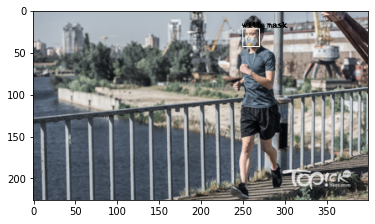

In [ ]:
# Открытие рандомной аннотации 
annotation_file = annotation_random[0]
with open(annotation_file, "r") as file:
    annotation_list = file.read().split("\n")[:-1]
    annotation_list = [x.split(" ") for x in annotation_list]
    annotation_list = [[float(y) for y in x ] for x in annotation_list]

# Нахождение соответствующего изображения
image_file = annotation_file.replace('coordinate','images').replace("txt", "png")
assert os.path.exists(image_file)

# Вывод изображения
image = Im.open(image_file)

# Вывод бокса
plot_bounding_box(image, annotation_list)

### Разделение выборки на train и val

In [ ]:
image_ids = xml_df['filename'].unique()

In [ ]:
data_size = len(image_ids)
train_size = 683
val_size = data_size - train_size
print(f'Количество объектов в датасете {data_size}')
print(f'Количество объектов для обучения {train_size}')
print(f'Количество объектов для валидации {val_size}')

Количество объектов в датасете 853
Количество объектов для обучения 683
Количество объектов для валидации 170


In [ ]:
train_ids = image_ids[:train_size]
val_ids = image_ids[-val_size:]

In [ ]:
train_df = xml_df[xml_df['filename'].isin(train_ids)]
val_df = xml_df[xml_df['filename'].isin(val_ids)]

In [ ]:
# функция, создающая структуру датасета, необходимую для работы yolov5
def dir_yolov5(df, flag):
  if os.path.isdir(os.path.join('dataset', flag)):
    shutil.rmtree(os.path.join('dataset', flag))
  os.makedirs(os.path.join('dataset', flag, 'images'))
  os.makedirs(os.path.join('dataset', flag, 'labels'))
    
  for filename in df['filename']:
    shutil.copy(os.path.join('/content/masks/images', filename),
                os.path.join('dataset', flag, 'images'))
    shutil.copy(os.path.join('/content/masks/coordinate', filename.replace("jpg", "txt")),
                os.path.join('dataset', flag, 'labels'))

In [ ]:
dir_yolov5(train_df, 'train')
dir_yolov5(val_df, 'valid')

## Проверка разделения выборки

In [ ]:
img_train_count = len(os.listdir('dataset/train/images'))
img_val_count = len(os.listdir('dataset/valid/images'))
print(f'Количество изображений для обучения {img_train_count}')
print(f'Количество изображений для валидации {img_val_count}')

Количество изображений для обучения 683
Количество изображений для валидации 170


# Загрузка модели

In [ ]:
!git clone https://github.com/ultralytics/yolov5

Cloning into 'yolov5'...
remote: Enumerating objects: 12557, done.
remote: Counting objects: 100% (105/105), done.
remote: Compressing objects: 100% (75/75), done.
remote: Total 12557 (delta 57), reused 65 (delta 30), pack-reused 12452
Receiving objects: 100% (12557/12557), 12.54 MiB | 32.26 MiB/s, done.
Resolving deltas: 100% (8593/8593), done.


In [ ]:
%cd yolov5

/content/yolov5


In [ ]:
%pip install -r requirements.txt

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


## Подгрузка yaml-файла с google drive

In [ ]:
path_yaml = "/content/gdrive/MyDrive/SF/Project_2_Face_Mask_Detection/masks.yaml"
#path_hyp = "/content/gdrive/MyDrive/SF/Project_2_Face_Mask_Detection/my_hyp.yaml"

In [ ]:
shutil.copy(path_yaml,'/content/yolov5/data/masks.yaml')

'/content/yolov5/data/masks.yaml'

In [ ]:
#shutil.copy(path_hyp,'/content/yolov5/data/hyps/my_hyp.yaml')

## Обучение
#### 100 эпох, 16 изображения в батче, с предобученными весами

In [ ]:
! python train.py --img 640 --batch 16 --epochs 100 --data masks.yaml --weights yolov5x.pt

train: weights=yolov5x.pt, cfg=, data=masks.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=100, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.1-376-g48a8531 Python-3.7.13 torch-1.12.0+cu113 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, 

## Визуализация обучения

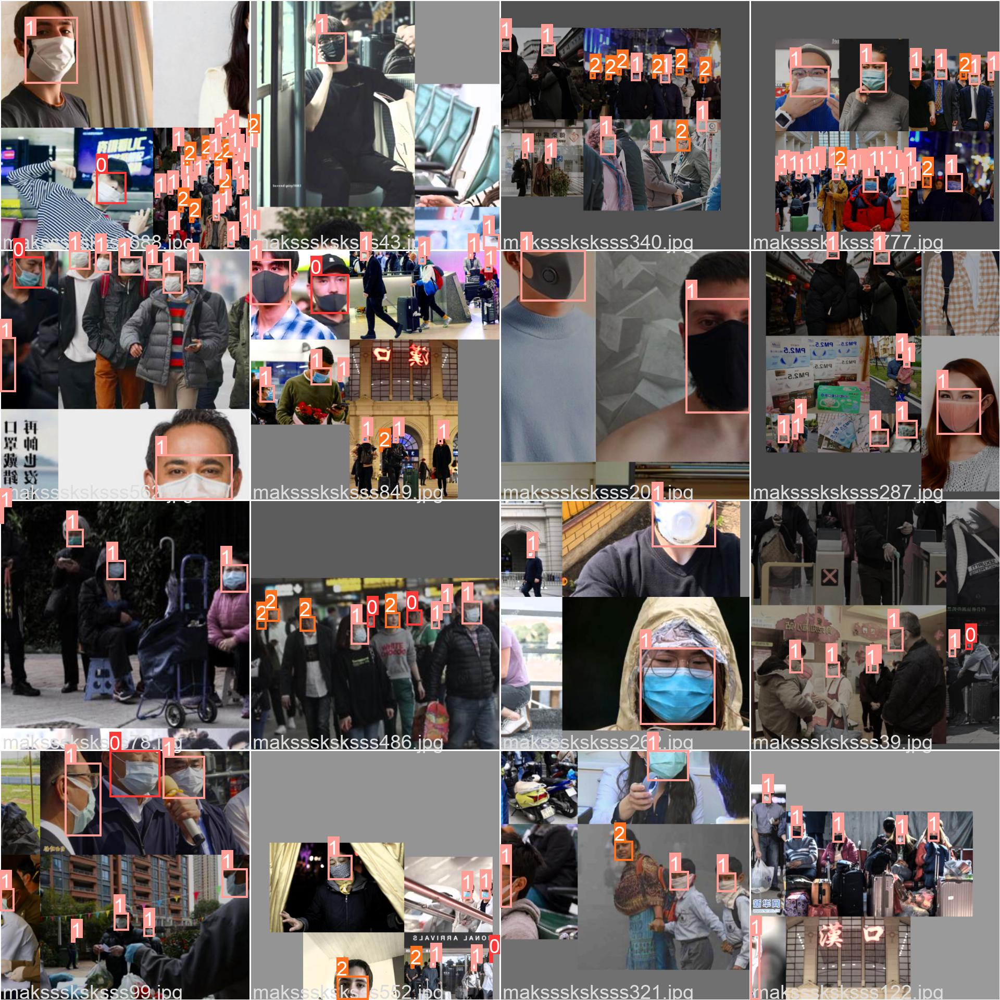

In [ ]:
Image('runs/train/exp/train_batch2.jpg', retina = True)

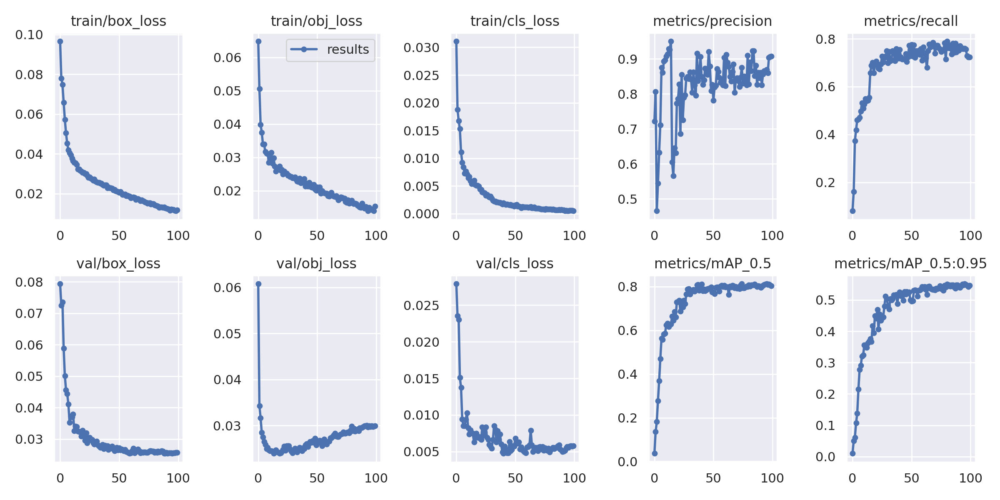

In [ ]:
Image('runs/train/exp/results.png', retina = True)

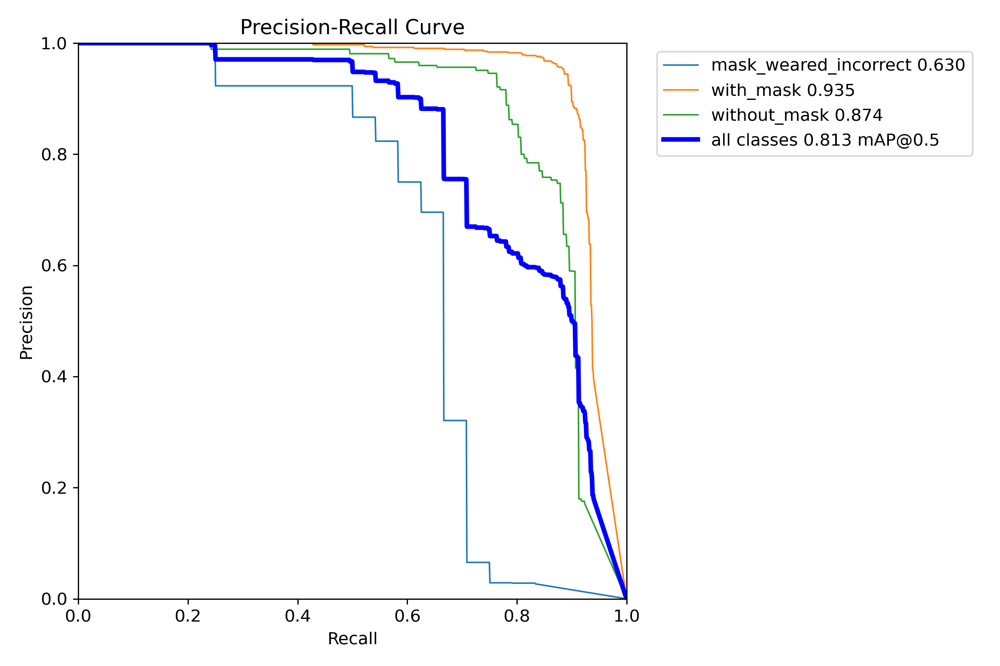

In [ ]:
Image('runs/train/exp/PR_curve.png', retina = True)

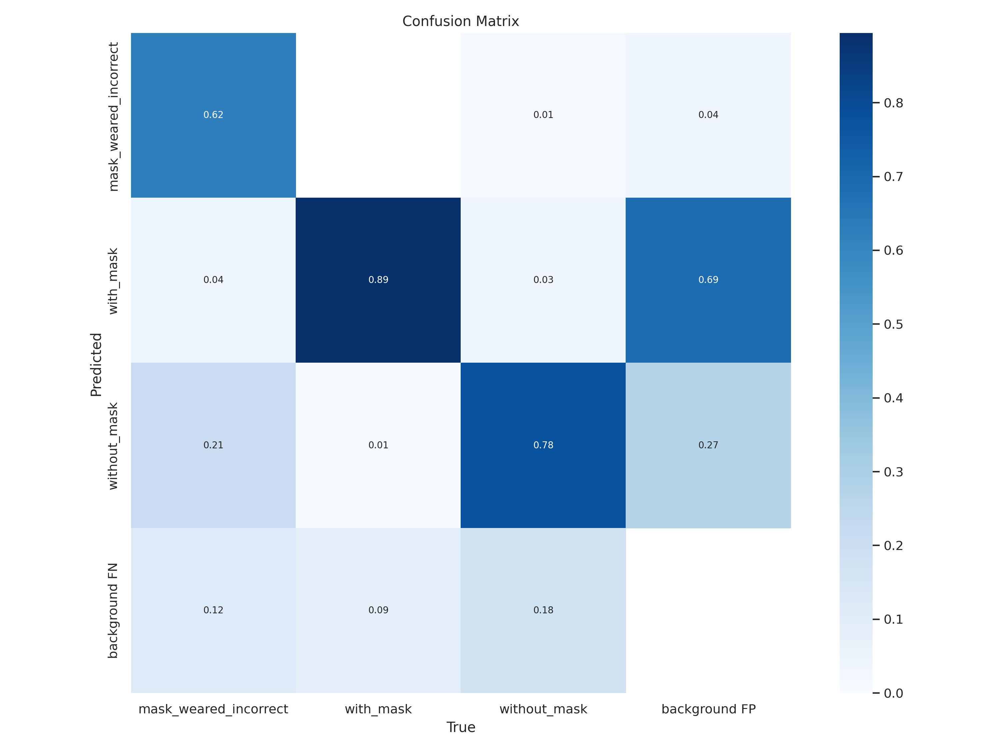

In [ ]:
Image('runs/train/exp/confusion_matrix.png', retina = True)

## Валидация

In [ ]:
! python val.py --weights runs/train/exp/weights/best.pt --data masks.yaml --img 640 --half --save-json

val: data=/content/yolov5/data/masks.yaml, weights=['runs/train/exp/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.6, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=True, project=runs/val, name=exp, exist_ok=False, half=True, dnn=False
YOLOv5 🚀 v6.1-376-g48a8531 Python-3.7.13 torch-1.12.0+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 444 layers, 86186872 parameters, 0 gradients, 203.8 GFLOPs
val: Scanning '/content/yolov5/../dataset/valid/labels.cache' images and labels... 170 found, 0 missing, 0 empty, 0 corrupt: 100% 170/170 [00:00<?, ?it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95: 100% 6/6 [00:06<00:00,  1.15s/it]
                 all        170        832      0.869       0.76      0.813      0.552
mask_weared_incorrect        170         24      0.748      0.619       0.63       0.46
          

## Визуализация валидации

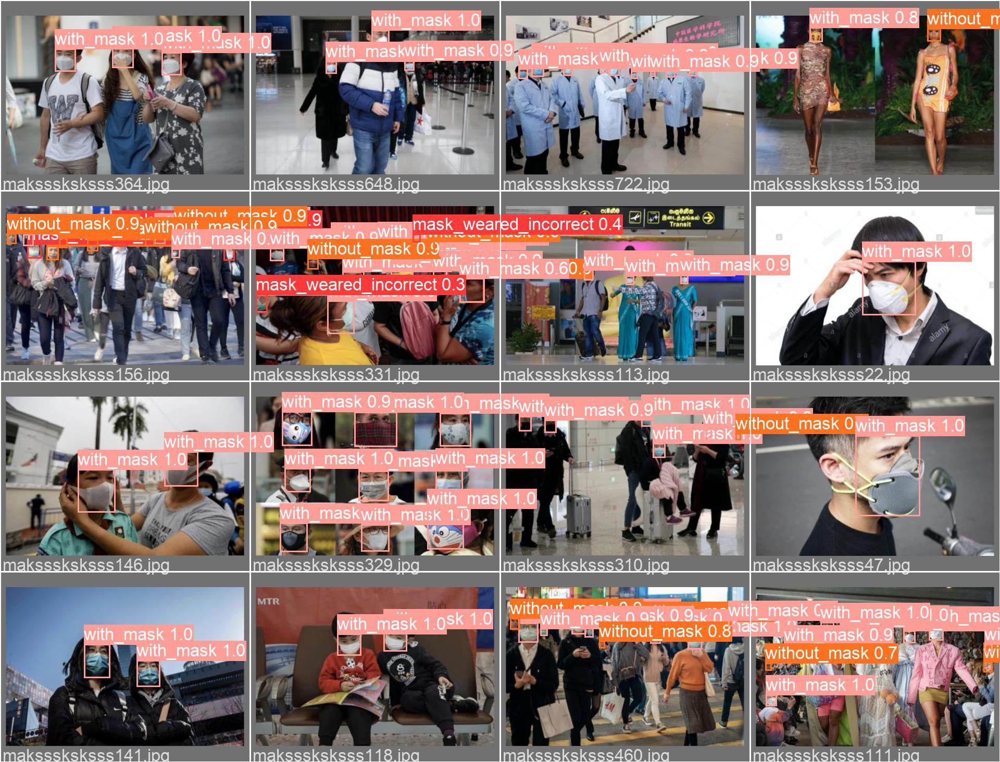

In [ ]:
Image('runs/val/exp/val_batch2_pred.jpg', retina = True)

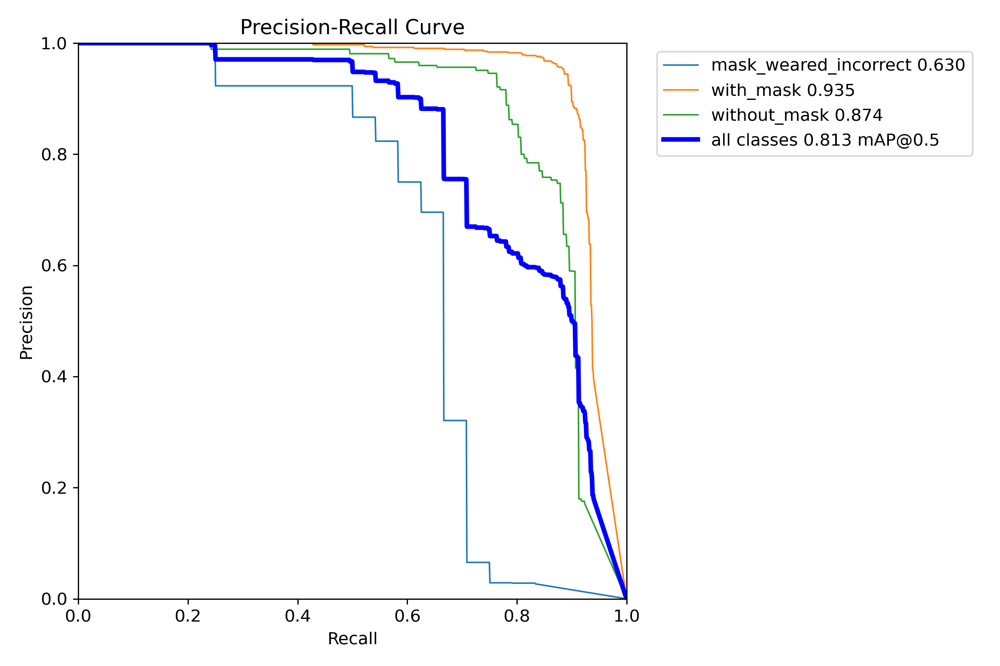

In [ ]:
Image('runs/val/exp/PR_curve.png', retina = True)

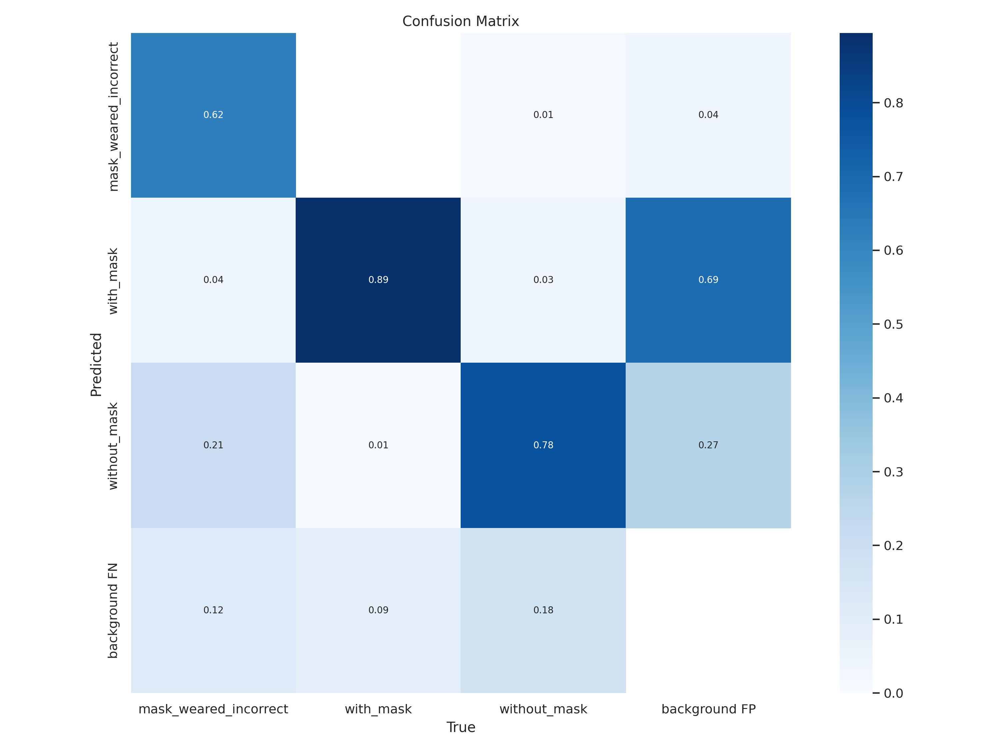

In [ ]:
Image('runs/val/exp/confusion_matrix.png', retina = True)

## Выводы

На данном датасете эфективнее и быстрее работает RCNN, так как показатели качества и временные характеристика на RCNN на 10 эпохах лучше (iou = 0.78, AP =  0.853, time= 0.3 часа) чем Yolo-l на 100 эпохах (mAP0.5 =  0.81, time= 1.5 часа). Одна из причин этому плохая способность Yolo работать с небольшими объектами. Не смотря на то, что данный вариант модели Yolo после 40 эпох стал переобучаться, это является самым эффективным вариантом из всех, которые были запущены.  Адекатный расчет IoU для результатов Yolo не удалось выполнить, так как в выходном json-файле модель хранит все предагаемые области без учета эффективности предсказания.